In [1]:
from meow.dataloaders import MEOWDataset
from meow.dataloaders.torch import MeowTorchDataset
from saroptreg_models.scheme import SAROptRegDatasetWrapper
from saroptreg_models import ROOT_DIR
from saroptreg_models.viz_normalization import plot_opt_with_template_overlay

In [2]:
import torch
from torch.utils.data import DataLoader
dataset = SAROptRegDatasetWrapper(MeowTorchDataset(r"./meow-sample/bordeaux"), resize=(512,512))
batch_size = 4
shuffle = False
num_workers = 1 
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)


# MCGF

Naive Loss :  tensor([0., 0., 0., 0.])
Plotting for batch 0 OPT:2018_SPRING  SAR:2018_SPRING


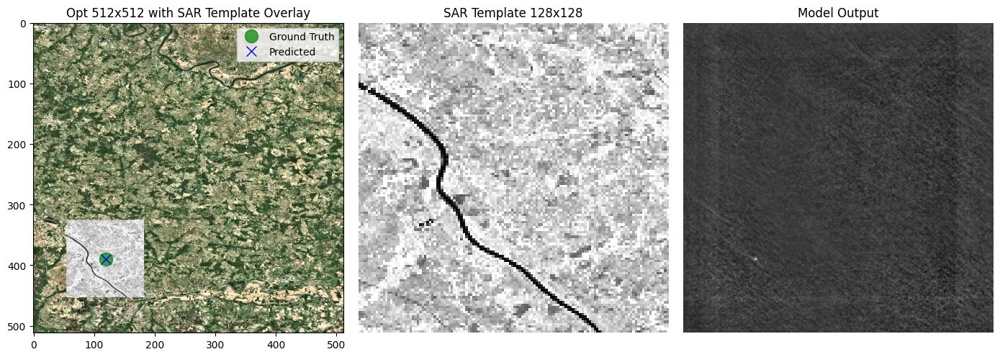

Plotting for batch 1 OPT:2018_SPRING  SAR:2018_WINTER


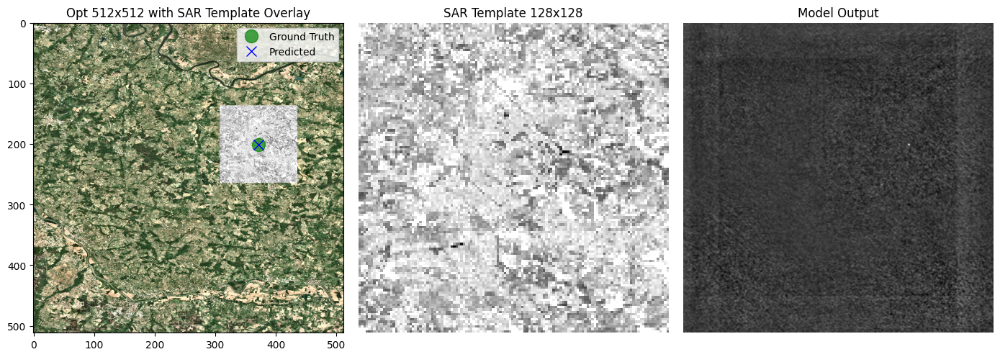

Plotting for batch 2 OPT:2018_SPRING  SAR:2018_AUTUMN


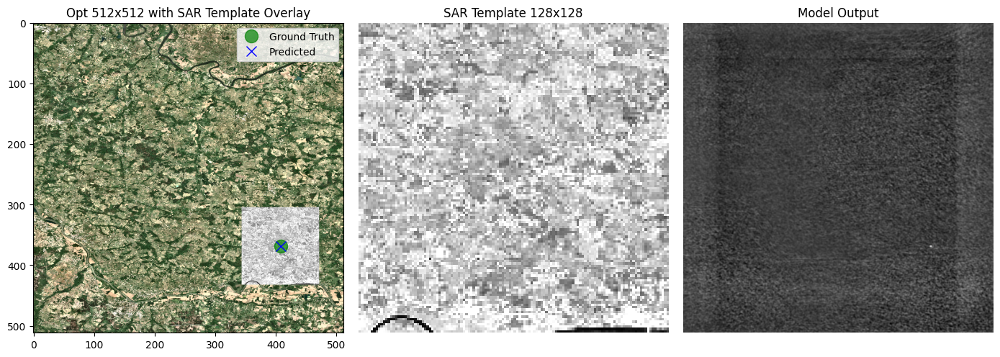

Plotting for batch 3 OPT:2018_SPRING  SAR:2018_SUMMER


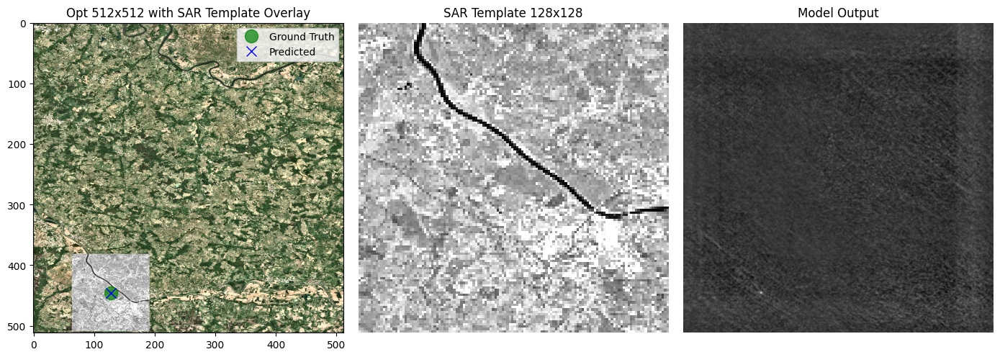

In [3]:

from saroptreg_models.models.mcgfs.arch import MCGF
from saroptreg_models.models.mcgfs.scheme import MCGFTrainingScheme

model = MCGF()
model.load_state_dict( torch.load(
        ROOT_DIR.joinpath("weights/original_mcgf_state_dict.pt"),
        map_location="cpu",
    )
)
model.eval()
training = MCGFTrainingScheme(model)
sample = training(next(iter(dataloader)))
print("Naive Loss : ", (sample.ijGTruth - sample.ijPred).norm(dim=-1))
for batch in range(batch_size):
    print(f"Plotting for batch {batch} OPT:{sample.mode_im[batch]}  SAR:{sample.mode_templates[batch]}")
    plot_opt_with_template_overlay(sample,batch, dataset)

# OSMNet

Naive Loss :  tensor([0., 0., 0., 0.])
Plotting for batch 0 OPT:2018_SPRING  SAR:2018_SPRING


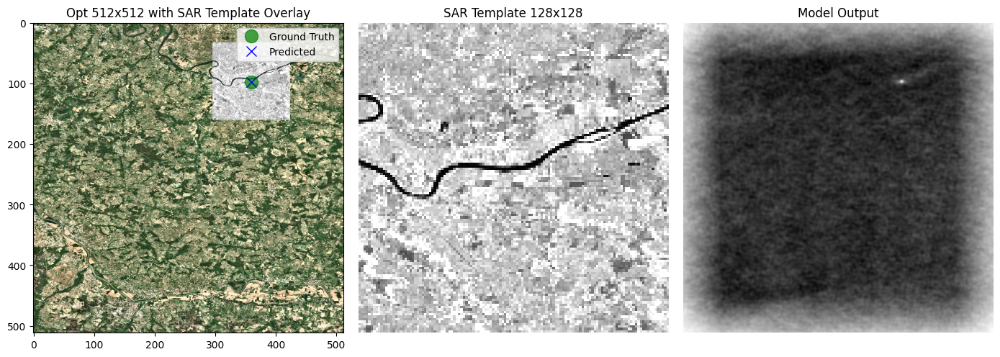

Plotting for batch 1 OPT:2018_SPRING  SAR:2018_WINTER


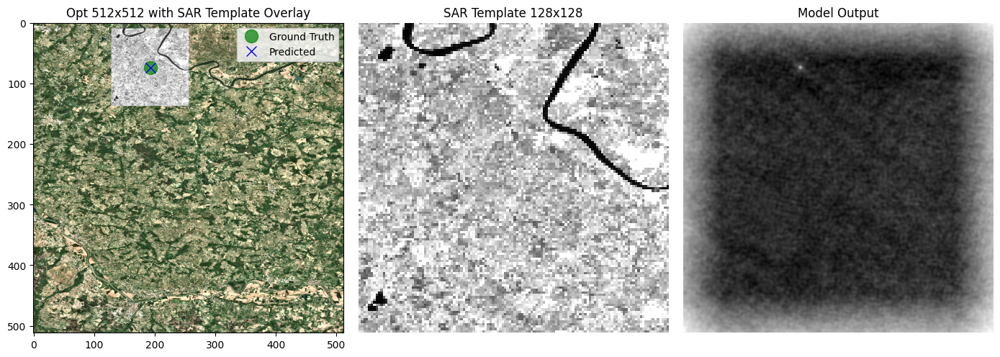

Plotting for batch 2 OPT:2018_SPRING  SAR:2018_AUTUMN


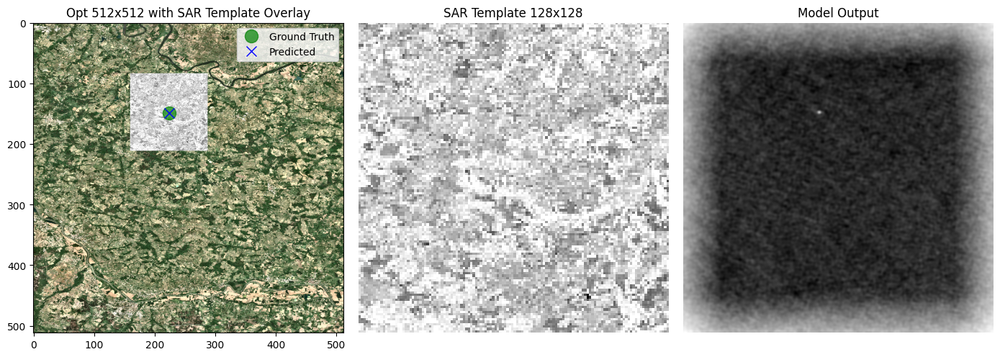

Plotting for batch 3 OPT:2018_SPRING  SAR:2018_SUMMER


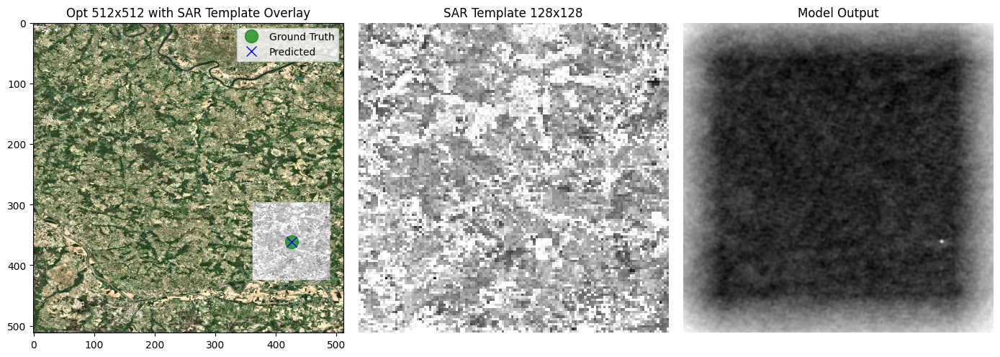

In [4]:

from saroptreg_models.models.osmnet.arch import OSMNet
from saroptreg_models.models.osmnet.scheme import OSMNetTrainingScheme

model = OSMNet()
model.load_state_dict( torch.load(
        ROOT_DIR.joinpath("weights/original_osmnet_state_dict.pt"),
        map_location="cpu",
    )
)
model.eval()
training = OSMNetTrainingScheme(model, templateSize=(128, 128))
sample = training(next(iter(dataloader)))
print("Naive Loss : ", (sample.ijGTruth - sample.ijPred).norm(dim=-1))
for batch in range(batch_size):
    print(f"Plotting for batch {batch} OPT:{sample.mode_im[batch]}  SAR:{sample.mode_templates[batch]}")
    plot_opt_with_template_overlay(sample,batch, dataset)

# FFTUNet

Naive Loss :  tensor([0., 0., 0., 0.])
Plotting for batch 0 OPT:2018_SPRING  SAR:2018_SPRING


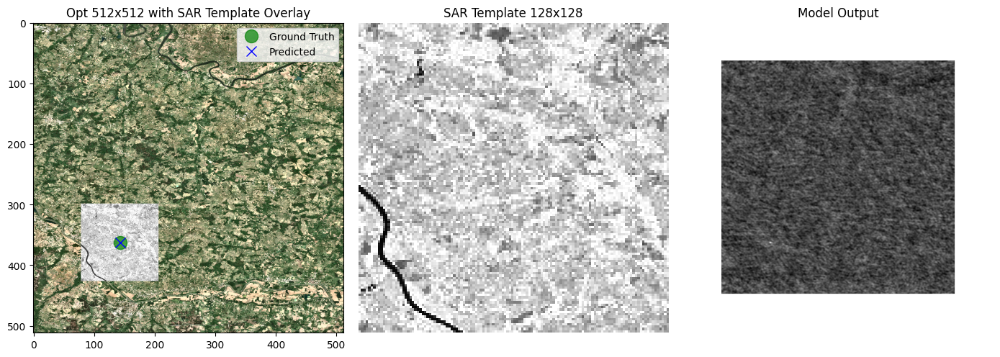

Plotting for batch 1 OPT:2018_SPRING  SAR:2018_WINTER


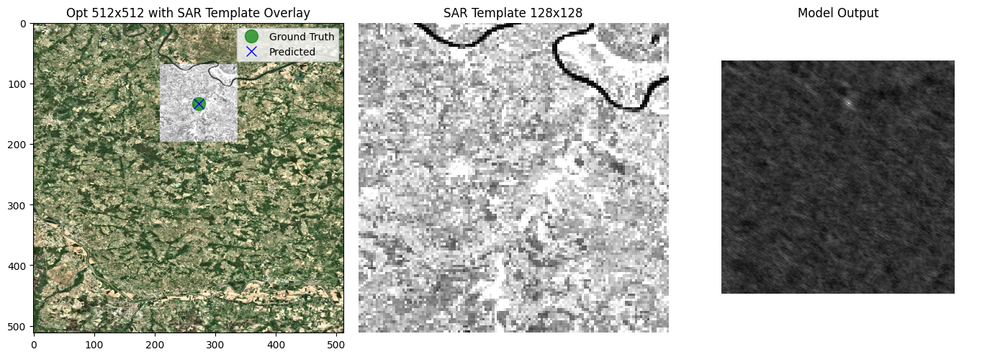

Plotting for batch 2 OPT:2018_SPRING  SAR:2018_AUTUMN


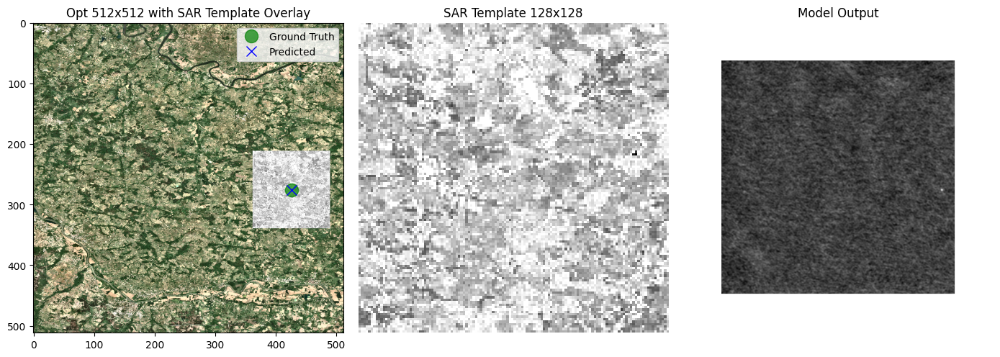

Plotting for batch 3 OPT:2018_SPRING  SAR:2018_SUMMER


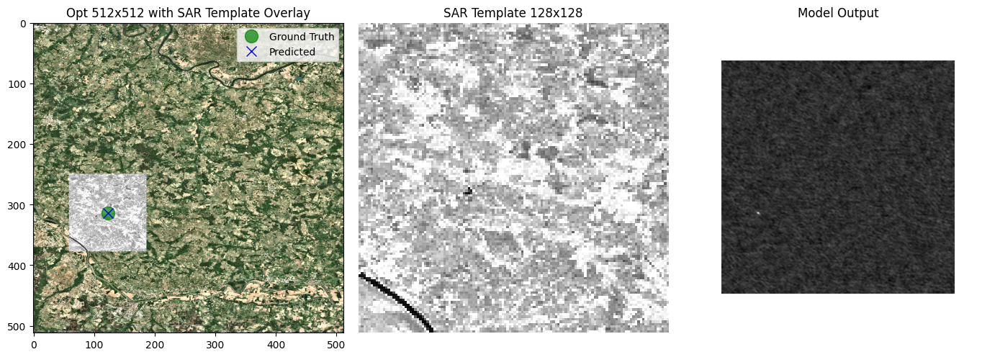

In [5]:
from saroptreg_models.models.fftunet.arch import FFTUnet
from saroptreg_models.models.fftunet.scheme import FFTUnetTrainingScheme

model = FFTUnet()
model.load_state_dict( torch.load(
        ROOT_DIR.joinpath("weights/original_fftunet_state_dict.pt"),
        map_location="cpu",
    )
)
model.eval()
training = FFTUnetTrainingScheme(model, templateSize=(128, 128))
sample = training(next(iter(dataloader)))
print("Naive Loss : ", (sample.ijGTruth - sample.ijPred).norm(dim=-1))
for batch in range(batch_size):
    print(f"Plotting for batch {batch} OPT:{sample.mode_im[batch]}  SAR:{sample.mode_templates[batch]}")
    plot_opt_with_template_overlay(sample,batch, dataset)

# MARUNET

Naive Loss :  tensor([0., 0., 0., 0.])
Plotting for batch 0 OPT:2018_SPRING  SAR:2018_SPRING


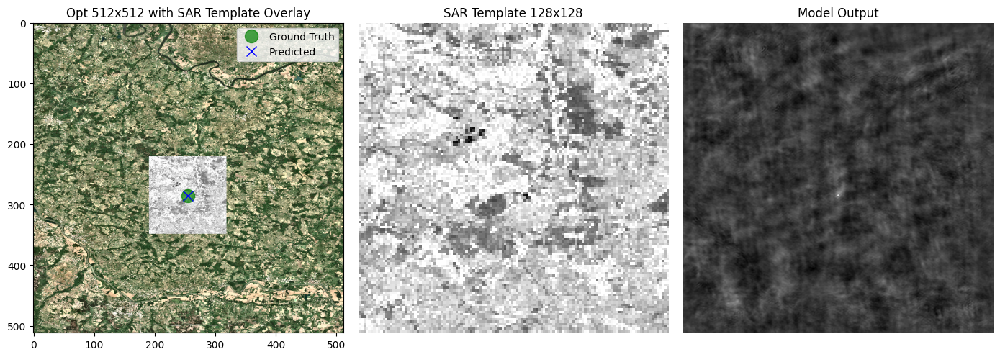

Plotting for batch 1 OPT:2018_SPRING  SAR:2018_WINTER


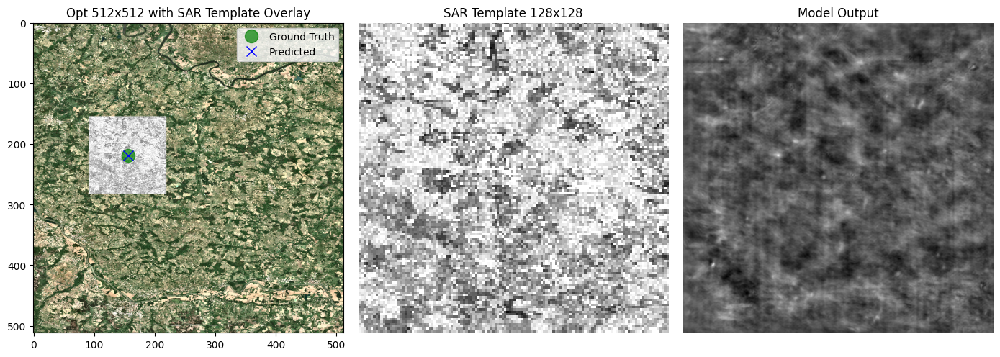

Plotting for batch 2 OPT:2018_SPRING  SAR:2018_AUTUMN


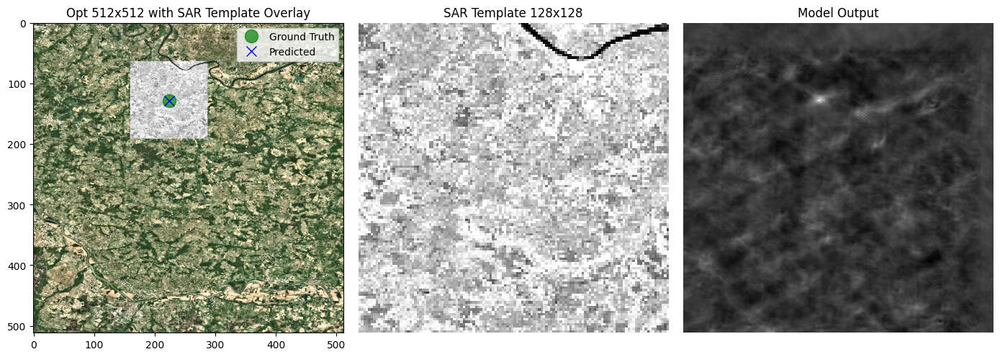

Plotting for batch 3 OPT:2018_SPRING  SAR:2018_SUMMER


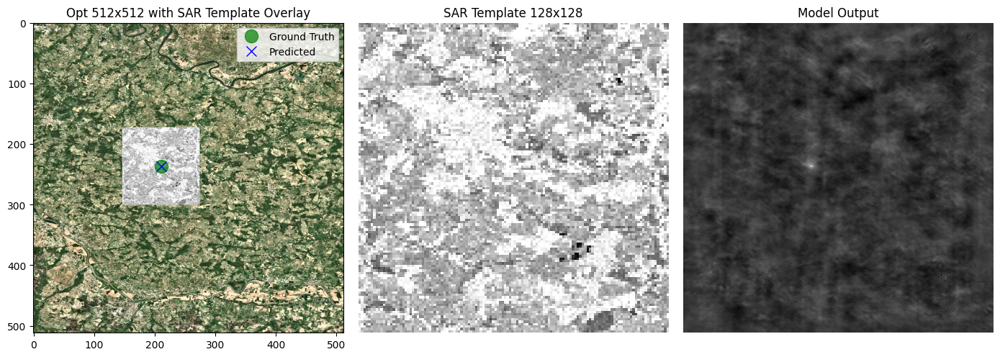

In [6]:

from saroptreg_models.models.marunet.arch import MARUNet
from saroptreg_models.models.marunet.scheme import MARUnetTrainingScheme

model = MARUNet(3)
model.load_state_dict( torch.load(
        ROOT_DIR.joinpath("weights/original_marunet_state_dict.pt"),
        map_location="cpu",
    )
)
model.eval()
training = MARUnetTrainingScheme(model)
sample = training(next(iter(dataloader)))
print("Naive Loss : ", (sample.ijGTruth - sample.ijPred).norm(dim=-1))
for batch in range(batch_size):
    print(f"Plotting for batch {batch} OPT:{sample.mode_im[batch]}  SAR:{sample.mode_templates[batch]}")
    plot_opt_with_template_overlay(sample,batch, dataset)